# Inverted Pendulum NL stability analysis and RL example



In [1]:
import gymnasium as gym
import stable_baselines3 as sb3

# for the phase portraits
from scipy.integrate import odeint
import numpy as np

from inverted_pendulum_utils import  PendulumAnimator, collect_trajectory, test_model, plot_actions, collect_info, plot_phase_streamlines
from inverted_pendulum_env import InvertedPendulumEnv

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from IPython.display import display

 We consider an inverted pendulum, so the pivot point is on the bottom. If the free end is at the top, $/theta = 0$. The control is a horizontal force / accelaration on the bottom. We do not care about the absolute position of the bottom. So the situation is like balancing a stick on your hands, or a rocket in air (but then in 1d)

With the appropriate normalization, we can write the inverted pendulum as a two-dimensional ordinary differential equation (ODE):

\begin{align*}
\dot{\theta} &= \omega \\
\dot{\omega} &= \sin(\theta) -c \omega +  u \cos(\theta)
\end{align*}


where $\theta$ is the angle, $\omega = \dot{\theta}$ is the angular velocity, and $u$ is the control input (horizontal force on the bottom).



Create the environment and the maximum number of timsteps for the tests and plots

In [5]:
# Set up the environment

# eta and zeta are the noise to the angle and angular velocity, respectively.
# c is the damping coefficient, which we set to 0.0 for now.

max_steps = 500 # -Set Maximum Steps for Trajectory Collection ---
env = InvertedPendulumEnv(c=0.0, eta=0.05,zeta=0.05, dt=0.1, max_steps = max_steps)
obs, info = env.reset(seed=42)  # Start properly



x,y 0.99962476388667 0.027392178163106788


#### First test a dummy model that applies no control

x,y 0.9993571065563182 0.035852106986671704
initial condition:
[0.03585211 0.9993571  0.        ]


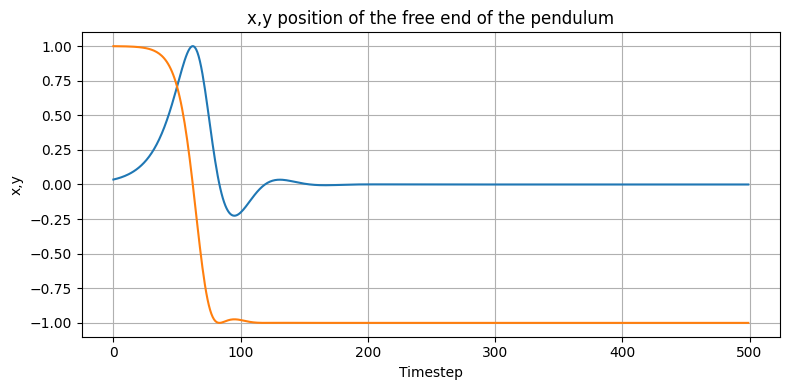

In [ ]:
class DummyAgent:
    def __init__(self, env):
        self.env = env
    def predict(self, obs):
        action = np.array([0.0,])
        return action, None

dummy_model = DummyAgent(env)
traj_dummy= collect_trajectory(env, dummy_model, max_steps=max_steps)

print('initial condition:')
print(traj_dummy[0,:])


Plotting the trajectory, we see that the pendulum starts close to the top position, but soon falls to the bottom position ($y=-1)

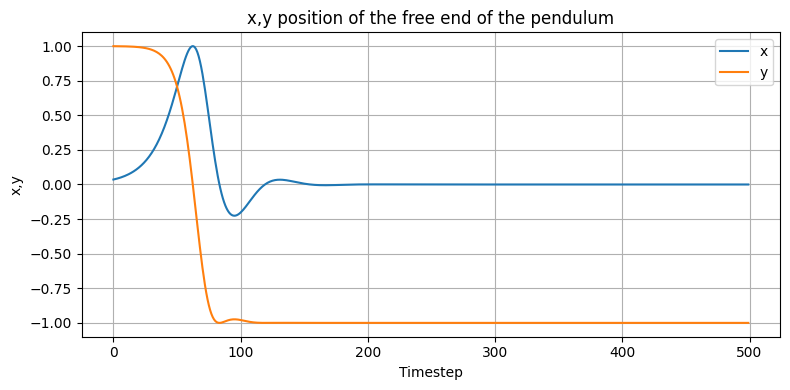

In [ ]:
# plot trajectory:
plt.figure(figsize=(8, 4))
plt.plot(traj_dummy[:,:2])
plt.xlabel('Timestep')
plt.ylabel('x,y')
plt.title('x,y position of the free end of the pendulum: No control')
plt.grid(True)
plt.legend(['x', 'y'])
plt.tight_layout()
#plt.savefig('trajectory_no_control.png')


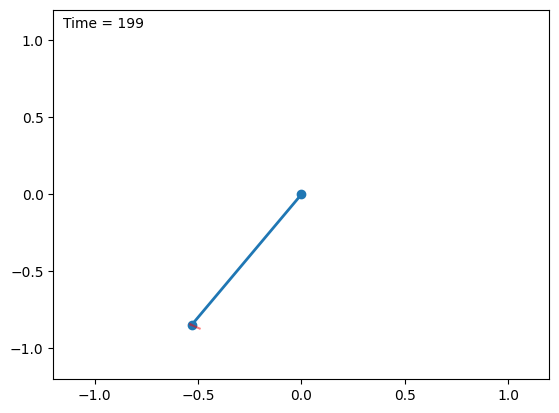

In [ ]:
# --- Visualize the Trajectory ---
#PendulumAnimator(traj_dummy).save_gif('dummy_model_trajectory.gif', fps=30)
anim = PendulumAnimator(traj_dummy).show()
#display(anim)

## Phase portrait without control:

Let's examine the system by looking at the phase portrait. We set $u=0$, and consider the dynamics. By performing a linear stability analysis, we can determine that the equilibrium points are at $\theta = 0, n \pi$ , and $\dot{\theta}=0$, see phase portrait below. Recall that for $n$ is even, the pendulum is pointing up, and for $n$ is odd, the pendulum is pointing down. Indeed, the fixed point at $\theta=0$ (pendulum pointing up) is unstable, while the fixed point at $\theta=\pi$ is stable.

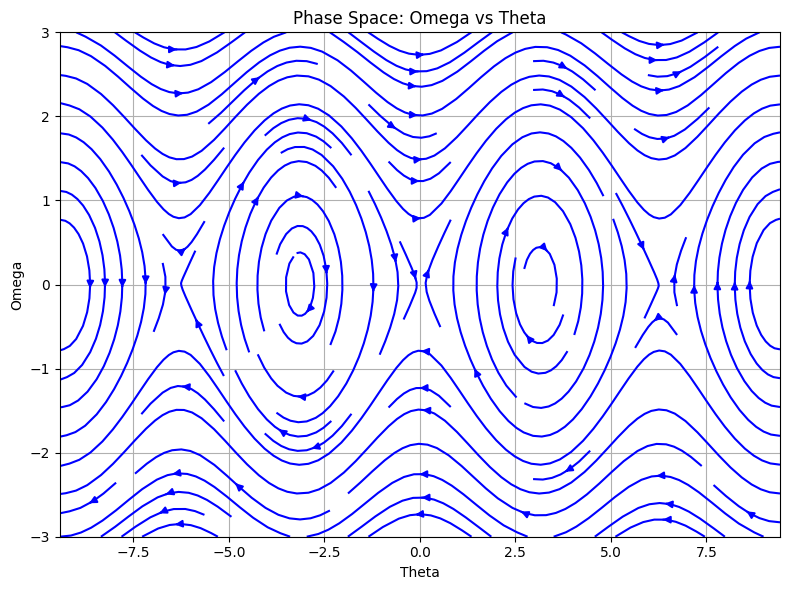

In [ ]:
# Phase portrait control
from itertools import combinations

class SinglePendulumOde():
    def __init__(self, theta, omega, control=False, damping=0.0, control_coeff=0.7):
        self.state = [theta, omega]
        self.params = {'control': control, 'damping': damping, 'control_coeff': control_coeff}


    def derivatives(self, state, t):
        theta, omega = state
        control  = self.params['control']
        c = self.params['damping']
        a = self.params['control_coeff']    

        if control == False: 
            u = 0
        else:  
            u = -2*a*np.sin(theta)-omega*np.cos(theta)

        dtheta_dt = omega
        domega_dt =(np.sin(theta) - c*omega + u*np.cos(theta)) 
        return [dtheta_dt, domega_dt]


# intialize the system and make the plot
pendulum_nocontrol = SinglePendulumOde(theta=0.1, omega=0.0, control=False, damping=0.0, control_coeff=0.7)
plot_phase_streamlines(pendulum_nocontrol, var_ranges=[(-3*np.pi, 3*np.pi), (-3, 3)], density=200)


## Applying analytic control:

The fixed point at $\theta=0$ (pendulum pointing up) is unstable. By finding Lyapunov potential function $V$ that is positive semi-definite, and its derivative negative-definite, we can deduce an analytic control function for $u$.  

Notice that the right hand side of the system is not time-dependent. Therefore we can apply the Krasovski-Lasalle theorem, which allows us to establish asmptotic stability of the fixed point under the less-stict condition that $\dot{V}$ is negative semi-definite. 






Let us choose the Lyapunov potential, and taylor expand it around the fixed point $\theta = \omega = 0$:

$V (\theta, \omega) = (\cos\theta − 1) + a(1 − \cos^2\theta)  + \frac{1}{2}\omega^2 \approx (a-\frac{1}{2})\theta^2 + \frac{1}{2}\omega^2$

This function is postive defnite if $a > \frac{1}{2}$. The time derivative of $V$ is

$\dot{V} (\theta, \omega)  = -\dot{\theta}\sin\theta + 2a\dot{\theta}\sin\theta\cos\theta + \dot{\omega}\omega  = \omega(u+2a\sin\theta)\cos\theta$

If we conveniently choose

$u = -2a \sin \theta - \omega \cos \theta$

this gives

$\dot{V} (\theta, \omega)  = \omega^2\cos^2\theta$

which is negative semidefinite, and thus is stable. Let's first look at the new phase portrait with the new definition of $u$. We now see a local attractor around $(0,0)$, the pendulum's top position.

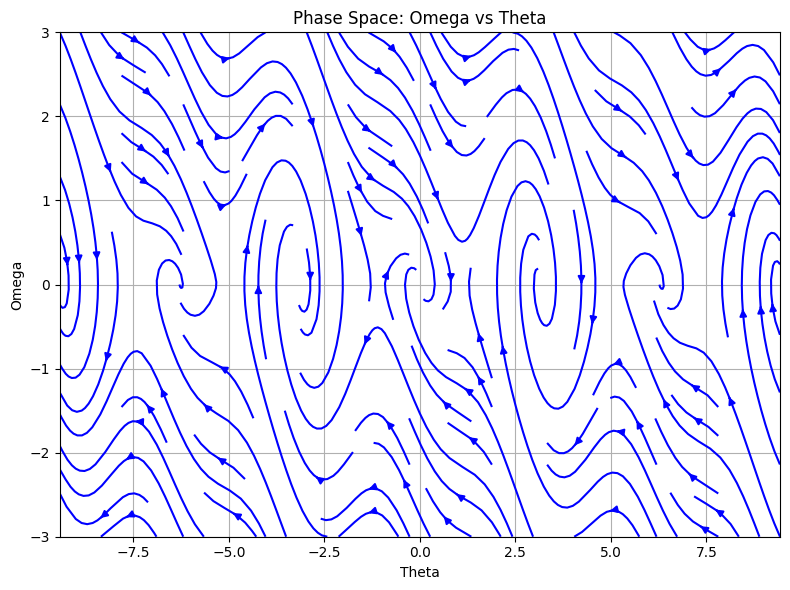

In [ ]:
# intialize the system and make the plot
pendulum_control = SinglePendulumOde(theta=0.1, omega=0.0, control=True, damping=0.0, control_coeff=1)
plot_phase_streamlines(pendulum_control, var_ranges=[(-3*np.pi, 3*np.pi), (-3, 3)], density=200)

We now implement it in an Analytic agent that applies this feedback law.

In [15]:
class AnalyticAgent:
    def __init__(self, env):
        self.env = env
    def predict(self, obs):
        action = None # this triggers to apply the analytic rule in the environment.
        return action, None
    

analytic_control_model = AnalyticAgent(env)
traj_analytic= collect_trajectory(env, analytic_control_model, max_steps=max_steps)





# Test the model again to make sure it works
ep_len, ep_rew = test_model(env, analytic_control_model)
print(f"Episode length: {ep_len}, reward: {ep_rew}")

x,y 1.0 0.0


TypeError: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'

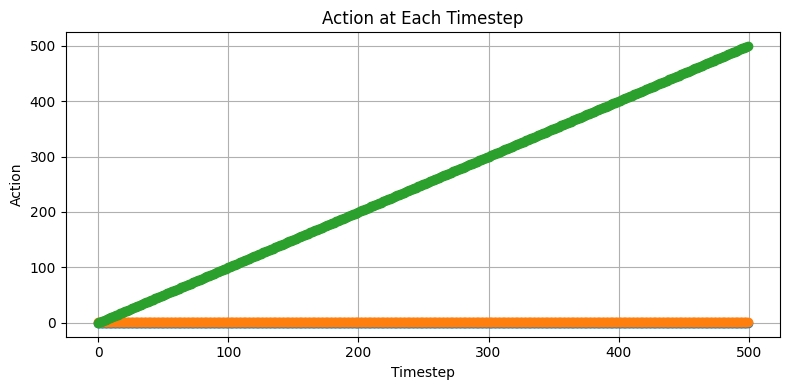

In [ ]:
action_analytic= collect_trajectory(env, analytic_control_model, max_steps=max_steps)

plot_actions(action_analytic)

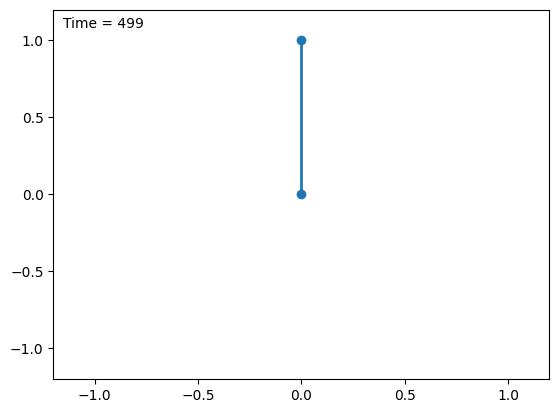

In [ ]:
# --- Visualize the Trajectory ---
#PendulumAnimator(traj_dummy).save_gif('dummy_model_trajectory.gif', fps=30)
anim = PendulumAnimator(traj_analytic).show()
display(anim)

#### Define an RL agent



In [ ]:
 # Initialize model
model = sb3.PPO(
    'MlpPolicy',
    env,
    learning_rate=0.003,       # Learning rate of neural network (default: 0.0003)
    n_steps=2048,               # Number of steps per update (default: 2048)
    batch_size=64,              # Minibatch size for NN update (default: 64)
    gamma=0.9,                 # Discount factor (default: 0.99)
    ent_coef=0.0,               # Entropy, how much to explore (default: 0.0)
    use_sde=True,               # Use generalized State Dependent Exploration (default: False)
    sde_sample_freq=4,          # Number of steps before sampling new noise matrix (default -1)
    policy_kwargs={'net_arch': [64, 64]}, # 2 hidden layers, 1 output layer (default: [64, 64])
    verbose=0                   # Print training metrics (default: 0)
)

# Training and testing hyperparameters
NUM_ROUNDS = 1
NUM_TRAINING_STEPS_PER_ROUND = 8000
NUM_TESTS_PER_ROUND = 100
MODEL_FILENAME_BASE = 'ppo_RL_agent2' # Base filename for saving the model

# Initialize lists to store average episode lengths and rewards
avg_ep_lens = []
avg_ep_rews = []

Round 0 | average test length: 200.0, average test reward: -1396.254191613232


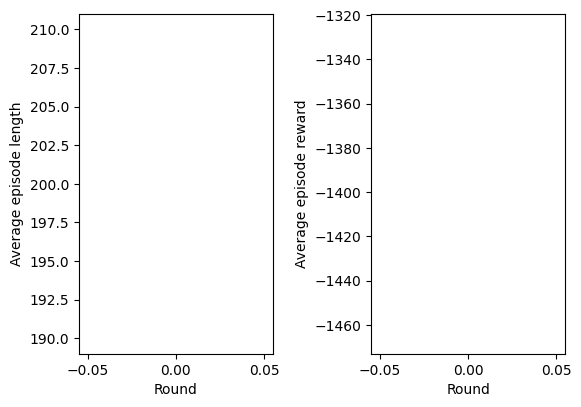

In [ ]:
for rnd in range(NUM_ROUNDS):

        # Train the model
        model.learn(total_timesteps=NUM_TRAINING_STEPS_PER_ROUND)

        # Save the model
        model.save(f"{MODEL_FILENAME_BASE}_{rnd}")

        # Test the model in several episodes
        avg_ep_len = 0
        avg_ep_rew = 0
        for ep in range(NUM_TESTS_PER_ROUND):
            ep_len, ep_rew = test_model(env, model)
            # Accumulate average length and reward
            avg_ep_len += ep_len
            avg_ep_rew += ep_rew

        # Record and display average episode length and reward
        avg_ep_len /= NUM_TESTS_PER_ROUND
        avg_ep_lens.append(avg_ep_len)
        avg_ep_rew /= NUM_TESTS_PER_ROUND
        avg_ep_rews.append(avg_ep_rew)
        print(f"Round {rnd} | average test length: {avg_ep_len}, average test reward: {avg_ep_rew}")

        # Plot average test episode lengths and rewards for each round
        fig, axs = plt.subplots(1, 2)
        fig.tight_layout(pad=4.0)
        axs[0].plot(avg_ep_lens)
        axs[0].set_ylabel("Average episode length")
        axs[0].set_xlabel("Round")
        axs[1].plot(avg_ep_rews)
        axs[1].set_ylabel("Average episode reward")
        axs[1].set_xlabel("Round")

#### Test the best model:

In [ ]:
# Load best model:
# Model and video settings
MODEL_FILENAME = "ppo_RL_agent2_0"

# Load the model
ppo_model = sb3.PPO.load(MODEL_FILENAME)
# Test the model again to make sure it works
ep_len, ep_rew = test_model(env, ppo_model)
print(f"Episode length: {ep_len}, reward: {ep_rew}")

traj_ppo= collect_trajectory(env, ppo_model, max_steps=200)


Episode length: 200, reward: -745.8931426624255


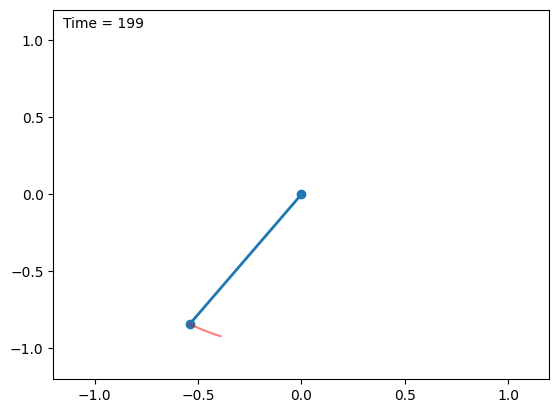

In [ ]:
# --- Visualize the Trajectory ---
#PendulumAnimator(traj_dummy).save_gif('dummy_model_trajectory.gif', fps=30)
anim = PendulumAnimator(traj_ppo).show()
display(anim)

## Nonlinear Dynamical system analysis

### Implement control law with Lyapunov analysis

Page 119, definition u

https://www.cds.caltech.edu/~murray/books/AM08/pdf/am08-dynamics_19Jul11.pdf
